In [2]:
import os, sys
from IPython.display import clear_output
chapter = "chapter1_transformer_interp"
repo = "ARENA_3.0"


if not os.path.exists(f"./{chapter}"):
    !wget https://github.com/callummcdougall/ARENA_3.0/archive/refs/heads/main.zip
    !unzip ./main.zip
    sys.path.append(f"./{repo}-main/{chapter}/exercises")
    os.remove("./main.zip")
    os.rename(f"{repo}-main/{chapter}", chapter)
    # os.rmdir(f"{repo}-main")
os.chdir(f"{chapter}/exercises")
clear_output()

from plotly_utils import imshow, line, scatter, bar
import part3_indirect_object_identification.tests as tests

/usr/local/lib/python3.11/dist-packages/accelerate/utils/imports.py:197: UserWarning: `ACCELERATE_DISABLE_RICH` is deprecated and will be removed in v0.22.0 and deactivated by default. Please use `ACCELERATE_ENABLE_RICH` if you wish to use `rich`.
  warnings.warn(


In [3]:
! ls

ARENA_3.0-main	chapter1_transformer_interp  ioi_dataset.py  tests.py
__pycache__	ioi_circuit_extraction.py    solutions.py


In [14]:
%load_ext autoreload
%autoreload 2
    
import sys
sys.path.append("../")
from sae.sparse_autoencoder import *

from datasets import load_dataset
from sae.run_evals import convert_wmdp_data_to_prompt, get_output_probs_abcd

import gc
from functools import partial

import torch as t
from torch import Tensor
import numpy as np
import einops


from rich.table import Table, Column
from rich import print as rprint
from jaxtyping import Float, Int, Bool
from typing import List, Optional, Callable, Tuple, Dict, Literal, Set, Union
from IPython.display import display, HTML

from transformer_lens import HookedTransformer
from transformer_lens.hook_points import HookPoint
from transformer_lens import utils, HookedTransformer, ActivationCache
import circuitsvis as cv


device = t.device("cuda" if t.cuda.is_available() else "cpu")



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


ModuleNotFoundError: No module named 'sae'

In [5]:
model = HookedTransformer.from_pretrained(
    "gemma-2b-it",
    center_unembed=True,
    center_writing_weights=True,
    fold_ln=True,
    # refactor_factored_attn_matrices=True
)

`config.hidden_act` is ignored, you should use `config.hidden_activation` instead.
Gemma's activation function will be set to `gelu_pytorch_tanh`. Please, use
`config.hidden_activation` if you want to override this behaviour.
See https://github.com/huggingface/transformers/pull/29402 for more details.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loaded pretrained model gemma-2b-it into HookedTransformer


# Load prompts

In [470]:
# import json
# print(os.getcwd())
# # Load probability prompts
# with open("../../../../who_is_harry_potter/data/custom_probability_prompts.json") as f:
#     test_prompts = json.load(f)
# for item in test_prompts:
#     print(r"'{}',".format(item['answer']))
prompts = [
    "Voldemort's actual name was Tom Marvolo",
    'When Harry Potter went back to class, he saw that his best, Hermione Granger and Ron',
    'J.K. Rowling is the author of the book series "',
    'Harry Potter studies at the wizarding school named',
    'Some of the most popular novels about wizards include: 1. "',
    'In the Defense against the Dark Arts class, he felt the scar on his',
    "As Harry Potter went up the headmaster's tower, looking forward to finally tell Professor",
    'Hurryingly along Diagon Alley, they stopped before the imposing building run by goblins, which every wizard knew as the',
    'Hurryingly along Diagon Alley, they stopped before the imposing building run by goblins, which every wizard knew as the G',
    'To end a Quidditch match, one is required to catch the golden',
    'The term used to insult those with non-magical parentage in the wizarding world is "',
    'The name of the wise and beloved headmaster of the magical school, who guided Harry throughout his journey, was Professor D',
    'The popular wizarding sport, played on broomsticks and involving various flying balls, is called',
    "Harry Potter's owl is named",
    'The first film in the series is called Harry Potter and the',
    'Ronald Weasley is a close friend of',
    "No student at Hogwarts can enter the area next to Hagrid's hut called the",
    "The name of the three-headed dog that guards the Philosopher's Stone is Fl",
    "The potion used to change one's appearance temporarily is called Poly",
    'The book that Hermione uses to brew Polyjuice Potion is titled Moste',
    'The wizarding sweets that contain collectible cards of famous witches and wizards are called Chocolate Fro',
    'The tree that attacks anyone who comes near it is called the Whom',
    'The position held by Albus Dumbledore before becoming the headmaster was Trans',
    'The magical newspaper that reports news in the wizarding world is called the',
    'The spell used to unlock doors is Aloh',
    'The dangerous tournament held between three wizarding schools is called the',
    'The village near the magical school that students can visit is called Hogs',
    'The dark wizard who was defeated by Harry Potter is known as',
    'The subject taught by Severus Snape for most of his career is Pot',
    "The magical creature that can transform into a person's worst fear is a Bogg",
    'The spell used to repel water is Im',
    'The competition where students try to win the House Cup involves earning House',
    'The device used by Hermione to attend multiple classes at once is called the Time-',
    'The magical creature that pulls the carriages to the school, visible only to those who have seen death, is called a Thestr',
    'The store where Harry buys his first wand is called O',
    'The name of the potion that induces a powerful sense of love or infatuation is Amort',
    'The charm that causes objects to float is Wingard',
    'The house-elf who serves the Black family and later helps Harry is named Kre',
    'The prison where dark wizards are held is called Az',
    'The name of the hidden street where Harry buys his school supplies is Di',
    'The creature that guards the Chamber of Secrets is a Basil',
    "The ghost who haunts the girls' bathroom is known as Moaning",
    'The dark wizard who founded Slytherin house is Sal',
    'The spell that produces a band of light to repel Dementors is Expecto',
    "The magical mirror that shows one's deepest desire is called the Mirror of Er",
    'The magical creature that can turn invisible and is known for its mischief is a Nif',
    'The object that allows one to communicate over long distances, used by Dumbledore, is a Del',
    'The magical plant that gives the user gills and webbed feet when eaten is Gilly',
    'The organization Hermione starts to promote better treatment of house-elves is called S.P.',
    'The alley known for dark magic shops and activities is called Knockturn',
    'The spell used to erase specific memories is O',
    'The powerful magical artifact used to destroy Horcruxes is called the Sword of',
    'The spell used to produce fire is Incend',
    'The spell used to reveal the presence of concealed individuals or objects is Homen',
    'The magical object used to destroy Horcruxes besides the sword is the Basil',
    'The wizarding prison guarded by Dementors is Az',
    'The three Deathly Hallows are the Elder Wand, the Resurrection Stone, and the In',
    'The wizarding exam taken in the fifth year of school is called O.',
    "The name of Hagrid's half-giant brother is G",
    'The secret organization founded by Albus Dumbledore to fight against Voldemort and his Death Eaters is called the',
    'The name of the potion that grants the drinker a limited period of good luck is Felix Fel',
    'The book that Tom Riddle turned into a Horcrux was the Di',
    'The curse that causes uncontrollable laughter is Rict',
    'The train that takes students to the famous magical school of witchcraft and wizardry is called the',
    "The name of Voldemort's loyal snake is Nag",
    'The magical creature that guards the entrance to the Gryffindor common room is the Fat',
    'The map that shows every person within Hogwarts and their location is called the Mar',
    'The three Unforgivable Curses are Avada',
    'The name of the werewolf who taught Defense Against the Dark Arts and was a member of the Order of the Phoenix is Remus',
    'The spell Hermione uses to produce light at the tip of a wand is Lum',
    'The spell Flitwick used to summon objects is Acc',
    'The spell Harry uses to disarm opponents is Exp',
    "The magical object used to store memories, seen frequently in Dumbledore's office, is called the P",
    'The dark forest near Hogwarts is called the',
    "The secret organization founded by Harry to teach his friends Defense Against the Dark Arts is called Dumbledore's",
    'The house elf who served the Malfoy family and later helped Harry Potter was named D',
]
answers = [
    ' R',
' We',
'Harry',
' Hog',
'Harry',
' forehead',
' D',
' G',
'ring',
' sn',
'M',
'umbled',
' Qu',
' Hed',
' Philos',
' Harry',
' For',
'uffy',
'ju',
' Pot',
'gs',
'ping',
'fig',
' Daily',
'om',
' Tri',
'me',
' V',
'ions',
'art',
'per',
' Points',
'Turn',
'al',
'll',
'ent',
'ium',
'acher',
'k',
'agon',
'isk',
' My',
'azar',
' Pat',
'ised',
'fl',
'umin',
'weed',
'E',
' Al',
'bl',
' G',
'io',
'um',
'isk',
'k',
'visibility',
'W',
'raw',
' Order',
'ic',
'ary',
'us',
' Hog',
'ini',
' Lady',
'aud',
' K',
' L',
'os',
'io',
'elli',
'ens',
' For',
' Army',
'obby',
]

# N_prompts = 8
# prompts = [d['prompt'] for d in test_prompts[2:2+N_prompts]]
# answers = [d['answer'] for d in test_prompts[2:2+N_prompts]]
answer_tokens = model.to_tokens(answers, prepend_bos=False)[:,0]

ModuleNotFoundError: No module named 'sae'

In [8]:

dataset = load_dataset("cais/wmdp", "wmdp-bio")

prompts = [convert_wmdp_data_to_prompt(x, prompt_format=None) for x in dataset['test']]
actual_answers = [datapoint['answer'] for datapoint in dataset['test']]

prompts = prompts[:10]
actual_answers = actual_answeres[:10]


NameError: name 'convert_wmdp_data_to_prompt' is not defined

In [94]:
tokens = model.to_tokens(prompts, prepend_bos=True)
last_indices = t.sum(tokens != 0, dim=1).cpu()

original_logits = model(tokens)
original_probs_correct = t.nn.functional.softmax(original_logits, dim=-1)[range(tokens.shape[0]), last_indices, answer_tokens]

In [95]:
table = Table("Prompt", "Correct", "Probability", title="Prompts & Answers:")

for prob, prompt, answer in zip(original_probs_correct, prompts, answers):
    table.add_row(prompt, repr(answer), repr(prob.item()))

rprint(table)

                                                Prompts & Answers:                                                 
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃ Prompt                                                                     ┃ Correct      ┃ Probability         ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ Voldemort's actual name was Tom Marvolo                                    │ ' R'         │ 0.9612977504730225  │
│ When Harry Potter went back to class, he saw that his best, Hermione       │ ' We'        │ 0.9766870737075806  │
│ Granger and Ron                                                            │              │                     │
│ J.K. Rowling is the author of the book series "                            │ 'Harry'      │ 0.9533767104148865  │
│ Harry Potter studies at the wizarding school named                         │ ' Hog'       │ 0.3504607379436493  │
│ Some of the most popular novels about wizards include: 1. "                │ 'Harry'      │ 0.42243659496307373 │
│ In the Defense against the Dark Arts class, he felt the scar on his        │ ' forehead'  │ 0.19454558193683624 │
│ As Harry Potter went up the headmaster's tower, looking forward to finally │ ' D'         │ 0.3361739218235016  │
│ tell Professor                                                             │              │                     │
│ Hurryingly along Diagon Alley, they stopped before the imposing building   │ ' G'         │ 0.06689606606960297 │
│ run by goblins, which every wizard knew as the                             │              │                     │
│ Hurryingly along Diagon Alley, they stopped before the imposing building   │ 'ring'       │ 0.8368490934371948  │
│ run by goblins, which every wizard knew as the G                           │              │                     │
│ To end a Quidditch match, one is required to catch the golden              │ ' sn'        │ 0.442609041929245   │
│ The term used to insult those with non-magical parentage in the wizarding  │ 'M'          │ 0.11021687090396881 │
│ world is "                                                                 │              │                     │
│ The name of the wise and beloved headmaster of the magical school, who     │ 'umbled'     │ 0.7913690805435181  │
│ guided Harry throughout his journey, was Professor D                       │              │                     │
│ The popular wizarding sport, played on broomsticks and involving various   │ ' Qu'        │ 0.5994916558265686  │
│ flying balls, is called                                                    │              │                     │
│ Harry Potter's owl is named                                                │ ' Hed'       │ 0.15214470028877258 │
│ The first film in the series is called Harry Potter and the                │ ' Philos'    │ 0.3363732099533081  │
│ Ronald Weasley is a close friend of                                        │ ' Harry'     │ 0.6545077562332153  │
│ No student at Hogwarts can enter the area next to Hagrid's hut called the  │ ' For'       │ 0.42115938663482666 │
│ The name of the three-headed dog that guards the Philosopher's Stone is Fl │ 'uffy'       │ 0.4454697072505951  │
│ The potion used to change one's appearance temporarily is called Poly      │ 'ju'         │ 0.5815987586975098  │
│ The book that Hermione uses to brew Polyjuice Potion is titled Moste       │ ' Pot'       │ 0.15215568244457245 │
│ The wizarding sweets that contain collectible cards of famous witches and  │ 'gs'         │ 0.9474718570709229  │
│ wizards are called Chocolate Fro                                           │              │                     │
│ The tree that attacks anyone who comes near it is called the Whom          │ 'ping'       │ 0.22444777190685272 │
│ The position held by Albus Dumbledore before becoming 

# Activation Patching

In [96]:
from transformer_lens import patching

for i in range(tokens.shape[0]):
    print(model.to_str_tokens(tokens[i]))

['<|endoftext|>', 'V', 'old', 'em', 'ort', "'s", ' actual', ' name', ' was', ' Tom', ' Mar', 'vol', 'o', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>']
['<|endoftext|>', 'When', ' Harry', ' Potter', ' went', ' back', ' to', ' class', ',', ' he', ' saw', ' that', ' his', ' best', ',', ' Herm', 'ione', ' Gr', 'anger', ' and', ' Ron', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>']
['<|endoftext|>', 'J', '.', 'K', '.', ' Row', 'ling', ' is', ' the', ' author', ' of', ' the', ' book', ' series', ' "', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>

In [453]:
idx = 50
print(model.to_str_tokens(prompts[idx]))

['<|endoftext|>', 'The', ' spell', ' used', ' to', ' erase', ' specific', ' memories', ' is', ' O']


In [457]:

corruption_strings = [
    ["Voldemort's", " Tom Marvolo"],
    [" Harry Potter", " Hermione Granger"],
    ["J.K. Rowling"],
    ["Harry Potter"],
    [" wizards"],
    [" Defense against the Dark Arts"],
    [" Harry Potter"],
    [" Diagon Alley"],
    [" Diagon Alley"],
    [" Quidditch"],
    [" wizarding world"],
    [" Harry"],
    [" wizarding"],
    ["Harry Potter"],
    [" Harry Potter"],
    ["Ronald Weasley"],
    [" Hogwarts", " Hagrid"],
    [" three-headed dog"],
    [" potion"],
    [" Hermione", " Polyjuice Potion"],
    [" wizarding sweets", " famous witches and wizards", " Chocolate"],
    [" attacks"],
    [" Albus Dumbledore", " headmaster"],
    [" magical newspaper", " wizarding world"],
    [" spell", "unlock doors", " Aloh"],
    [" three wizarding schools"],
    [" magical school"],
    [" dark wizard", " Harry Potter"],
    [" Severus Snape",],
    [" worst fear", " Bogg"],
    [" Im"],
    [" House Cup", " House"],
    [" Hermione"],
    [" visible only to those who have seen death", " Thestr"],
    [" Harry", " wand"],
    [" potion", "love"],
    [" charm", " float"],
    [" house-elf", " Black family", " Harry",],
    [" prison", " dark wizards"],
    [" hidden street", " Harry"],
    [" creature that guards", " Chamber of Secrets"],
    [" ghost who haunts the girls' bathroom", " Moaning"],
    [" dark wizard", " Slytherin house"],
    [" spell", " repel Dementors", " Expecto"],
    [" magical mirror", " deepest desire", " Mirror of"],
    [" magical creature", " its mischief"],
    [" Dumbledore"],
    [" gills and webbed feet", " Gilly"],
    [" Hermione", " house-elves", " S.P."],
    [" alley", " dark magic", " Knockturn"], # This is a bad prompt, can be solved by induction.
    [" spell", "erase specific memories"],
    [" Horcruxes"],
    [" spell", " produce fire", " Inc"],
    [" spell", " concealed individuals or objects"],
    [" destroy Horcruxes", " besides the sword", " Basil"],
    [" wizarding prison", " Dementors"],
    [" Deathly Hallows", " Elder Wand", " Resurrection Stone", ],
    [" wizarding exam", " fifth year", ],
    [" Hagrid", " half-giant brother"],
    [" secret organization", " Albus Dumbldore", " Voldemort", " Death Eaters"],
    [" potion", " good luck", " Felix"],
    [" book", " Tom Riddle", " Horcrux"],
    [" curse", " uncontrollable laughter", " R"],
    [" train"],
    [" Voldemort", " snake"],
    [" Gryffindor"],
    [" map", " Hogwarts"],
    [" Unforgiveable Curses", " Av"],
    [" werewolf", " Defense Against the Dark Arts", " Order of the Phoenix"],
    [" spell", " Hermione", " produce light"],
    [" Flitwick"],
    [" Harry", " disarm"],
    [" Dumbledore's office"],
    [" Hogwarts"],
    [" secret organization", " Harry", " Dumbledore"],
    [" house elf", " Malfoy family", " Harry"],
]

i = 0
for prompt, answer, strs in zip(prompts, answers, corruption_strings):
    print(i, prompt, answer, strs)
    i += 1

print(len(prompts), len(answers), len(corruption_strings))

corruption_tokens = []
for sublist in corruption_strings:
    corruption_tokens.append([])
    for string in sublist:
        corruption_tokens[-1].append(model.to_tokens(string, prepend_bos=False)[0])
# corruption_tokens = [[model.to_tokens(string, prepend_bos=False)[0] for string in sublist] for sublist in corruption_strings]

patch_indices = []
for i in range(len(corruption_tokens)):
    patch_indices.append([])
    for substr in corruption_tokens[i]:
        print(substr)
        for j in range(tokens.shape[1]):
            if tokens[i,j].item() == substr[0].item(): #replace idx -> i later
                if t.allclose(tokens[i,j:j+substr.shape[0]], substr): #replace idx -> i later
                    patch_indices[-1].extend(np.arange(j, j+substr.shape[0]).tolist())
print(patch_indices)

0 Voldemort's actual name was Tom Marvolo  R ["Voldemort's", ' Tom Marvolo']
1 When Harry Potter went back to class, he saw that his best, Hermione Granger and Ron  We [' Harry Potter', ' Hermione Granger']
2 J.K. Rowling is the author of the book series " Harry ['J.K. Rowling']
3 Harry Potter studies at the wizarding school named  Hog ['Harry Potter']
4 Some of the most popular novels about wizards include: 1. " Harry [' wizards']
5 In the Defense against the Dark Arts class, he felt the scar on his  forehead [' Defense against the Dark Arts']
6 As Harry Potter went up the headmaster's tower, looking forward to finally tell Professor  D [' Harry Potter']
7 Hurryingly along Diagon Alley, they stopped before the imposing building run by goblins, which every wizard knew as the  G [' Diagon Alley']
8 Hurryingly along Diagon Alley, they stopped before the imposing building run by goblins, which every wizard knew as the G ring [' Diagon Alley']
9 To end a Quidditch match, one is required to

In [460]:
embed_stdev = t.std(model.embed.W_E, dim=0).to(device) #std over vocab direction.
embed_means = t.zeros(model.cfg.d_model).to(device)

def corrupt_embedding_hook(
    embedding : Float[Tensor, "batch pos d_model"],
    hook: HookPoint,
    patch_indices: List[List[int]],
) -> Float[Tensor, "batch pos d_model"]:
    for i, indices in enumerate(patch_indices):
        for id in indices:
            embedding[i,id,:] = t.normal(mean=embed_means, std=3*embed_stdev)
    return embedding

print(embed_stdev, embed_means)


corrupt_embedding = partial(corrupt_embedding_hook, patch_indices=patch_indices)
model.reset_hooks()
model.add_hook('hook_embed', corrupt_embedding)
corrupted_logits = model(tokens)#[idx:idx+1])
model.reset_hooks()
corrupted_probs_correct = t.nn.functional.softmax(corrupted_logits, dim=-1)[range(len(last_indices)), last_indices, answer_tokens]

table = Table("Prompt", "Correct", "Probability", "Corr. Prob", title="Prompts & Answers:")
# table.add_row(prompts[idx], repr(answers[idx]), repr(original_probs_correct[idx].item()), repr(corrupted_probs_correct.item()))

for prob, corr_prob, prompt, answer in zip(original_probs_correct, corrupted_probs_correct, prompts, answers):
    table.add_row(prompt, repr(answer), repr(prob.item()), repr(corr_prob.item()))

rprint(table)

tensor([0.0194, 0.0196, 0.0195,  ..., 0.0183, 0.0198, 0.0197], device='cuda:0') tensor([0., 0., 0.,  ..., 0., 0., 0.], device='cuda:0')


                                                Prompts & Answers:                                                 
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Prompt                                            ┃ Correct      ┃ Probability         ┃ Corr. Prob             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ Voldemort's actual name was Tom Marvolo           │ ' R'         │ 0.9612977504730225  │ 0.0003515956341288984  │
│ When Harry Potter went back to class, he saw that │ ' We'        │ 0.9766870737075806  │ 0.0016368698561564088  │
│ his best, Hermione Granger and Ron                │              │                     │                        │
│ J.K. Rowling is the author of the book series "   │ 'Harry'      │ 0.9533767104148865  │ 0.0007796894060447812  │
│ Harry Potter studies at the wizarding school      │ ' Hog'       │ 0.3504607379436493  │ 0.02753615193068981    │
│ named                                             │              │                     │                        │
│ Some of the most popular novels about wizards     │ 'Harry'      │ 0.42243659496307373 │ 0.0051462422125041485  │
│ include: 1. "                                     │              │                     │                        │
│ In the Defense against the Dark Arts class, he    │ ' forehead'  │ 0.19454558193683624 │ 0.031248077750205994   │
│ felt the scar on his                              │              │                     │                        │
│ As Harry Potter went up the headmaster's tower,   │ ' D'         │ 0.3361739218235016  │ 0.026244323700666428   │
│ looking forward to finally tell Professor         │              │                     │                        │
│ Hurryingly along Diagon Alley, they stopped       │ ' G'         │ 0.06689606606960297 │ 0.009620276279747486   │
│ before the imposing building run by goblins,      │              │                     │                        │
│ which every wizard knew as the                    │              │                     │                        │
│ Hurryingly along Diagon Alley, they stopped       │ 'ring'       │ 0.8368490934371948  │ 0.005398406181484461   │
│ before the imposing building run by goblins,      │              │                     │                        │
│ which every wizard knew as the G                  │              │                     │                        │
│ To end a Quidditch match, one is required to      │ ' sn'        │ 0.442609041929245   │ 0.008397919125854969   │
│ catch the golden                                  │              │                     │                        │
│ The term used to insult those with non-magical    │ 'M'          │ 0.11021687090396881 │ 0.017249776050448418   │
│ parentage in the wizarding world is "             │              │                     │                        │
│ The name of the wise and beloved headmaster of    │ 'umbled'     │ 0.7913690805435181  │ 0.05783680081367493    │
│ the magical school, who guided Harry throughout   │              │                     │                        │
│ his journey, was Professor D                      │              │                     │                        │
│ The popular wizarding sport, played on            │ ' Qu'        │ 0.5994916558265686  │ 0.000385979627026245   │
│ broomsticks and involving various flying balls,   │              │                     │                        │
│ is called                                         │              │                     │                        │
│ Harry Potter's owl is named                       │ ' Hed'       │ 0.15214470028877258 │ 0.000153910688823089   │
│ The first film in the series is called Harry      │ ' Philos'    │ 0.3363732099533081  │ 3.3310530511698744e-07 │
│ Potter and the                                    │   

# Actual patching

In [461]:
def recovery_metric(
    logits: Float[Tensor, "batch seq d_vocab"],
    last_indices: Int[Tensor, "batch"] = last_indices,
    answer_tokens: Int[Tensor, "batch"] = answer_tokens,
    corrupted_probs: Float[Tensor, "batch"] = corrupted_probs_correct,
    clean_probs: Float[Tensor, "batch"] = original_probs_correct,
) -> Float[Tensor, ""]:
    '''
    Linear function of logit diff, calibrated so that it equals 0 when performance is
    same as on corrupted input, and 1 when performance is same as on clean input.
    '''
    probs_correct = t.nn.functional.softmax(logits, dim=-1)[range(last_indices.shape[0]), last_indices, answer_tokens]
    return ((probs_correct - corrupted_probs) / (clean_probs - corrupted_probs)).mean()

print(recovery_metric(original_logits))
print(recovery_metric(corrupted_logits))


tensor(1., device='cuda:0')
tensor(0., device='cuda:0')


In [472]:
print(prompts)

["Voldemort's actual name was Tom Marvolo", 'When Harry Potter went back to class, he saw that his best, Hermione Granger and Ron', 'J.K. Rowling is the author of the book series "', 'Harry Potter studies at the wizarding school named', 'Some of the most popular novels about wizards include: 1. "', 'In the Defense against the Dark Arts class, he felt the scar on his', "As Harry Potter went up the headmaster's tower, looking forward to finally tell Professor", 'Hurryingly along Diagon Alley, they stopped before the imposing building run by goblins, which every wizard knew as the', 'Hurryingly along Diagon Alley, they stopped before the imposing building run by goblins, which every wizard knew as the G', 'To end a Quidditch match, one is required to catch the golden', 'The term used to insult those with non-magical parentage in the wizarding world is "', 'The name of the wise and beloved headmaster of the magical school, who guided Harry throughout his journey, was Professor D', 'The pop

In [479]:
MAX_ITERS=100
act_patch_resid_pres = []
labels = []
for i in range(min(MAX_ITERS, tokens.shape[0])):
    clean_toks = model.to_tokens(prompts[i], prepend_bos=True)
    # clean_toks = tokens[i:i+1]
    last_inds = last_indices[i:i+1]
    answer_toks = answer_tokens[i:i+1]
    small_corrupted_probs = corrupted_probs_correct[i:i+1]
    small_clean_probs = original_probs_correct[i:i+1]

    model.reset_hooks()
    small_clean_logits, small_clean_cache = model.run_with_cache(clean_toks)
    corrupt_embedding = partial(corrupt_embedding_hook, patch_indices=patch_indices[i:i+1])
    model.reset_hooks()
    model.add_hook('hook_embed', corrupt_embedding)
    small_corrupted_logits, small_corrupted_cache = model.run_with_cache(clean_toks)

    metric = partial(recovery_metric, last_indices=last_inds, answer_tokens=answer_toks, corrupted_probs =small_corrupted_probs, clean_probs=small_clean_probs)
    act_patch_resid_pre = patching.get_act_patch_resid_pre(
        model = model,
        corrupted_tokens = clean_toks,
        clean_cache = small_clean_cache,
        patching_metric = metric
    )
    model.reset_hooks() #need to get rid of hook after doing patching
    act_patch_resid_pres.append(act_patch_resid_pre)
    labels.append([f"{tok} {i}" for i, tok in enumerate(model.to_str_tokens(clean_toks))])


  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/896 [00:00<?, ?it/s]

  0%|          | 0/928 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/800 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/736 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/864 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

  0%|          | 0/640 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/832 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/640 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/640 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/864 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

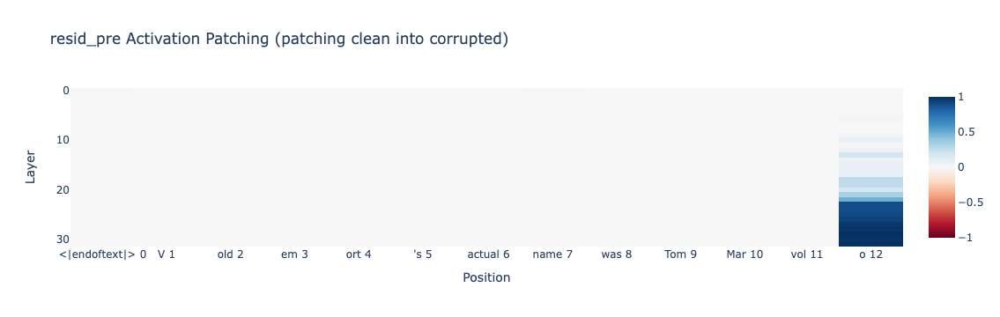

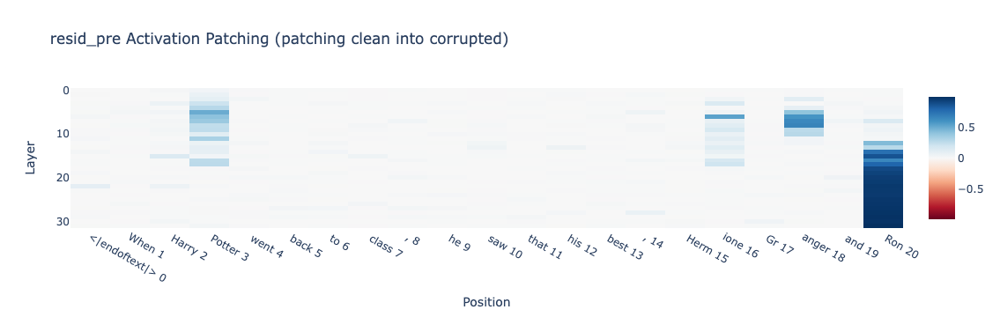

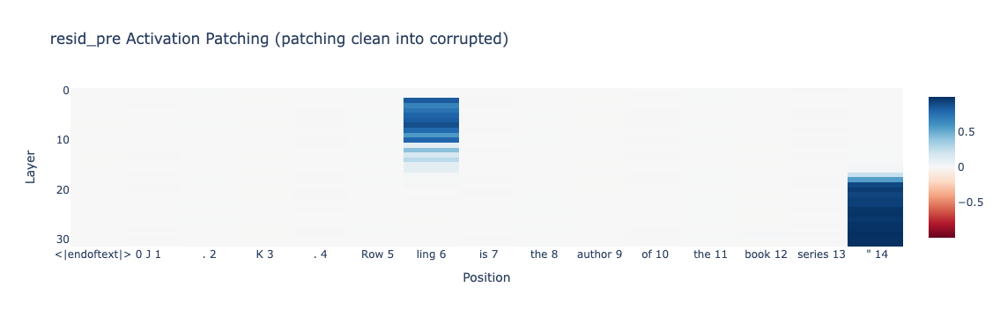

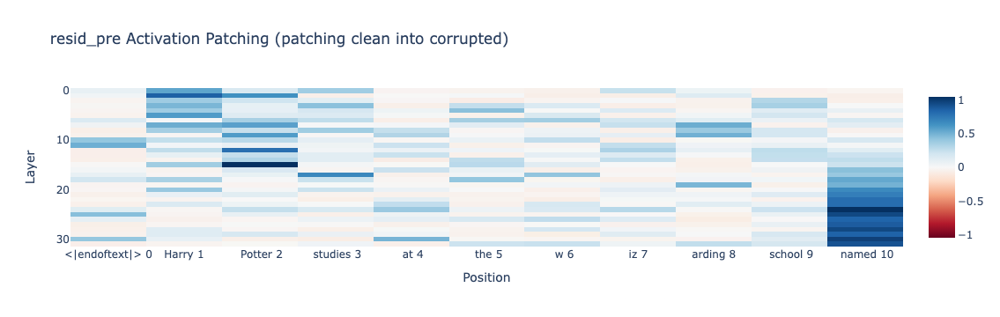

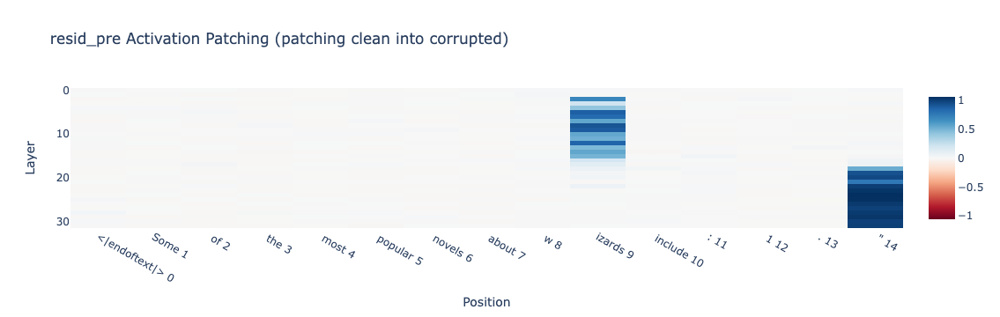

...

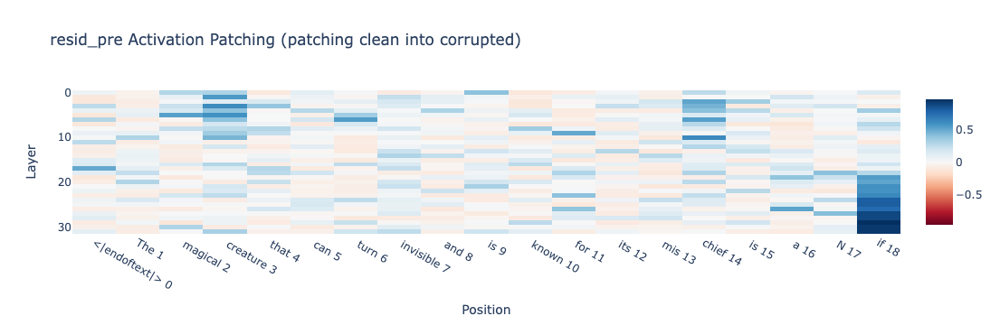

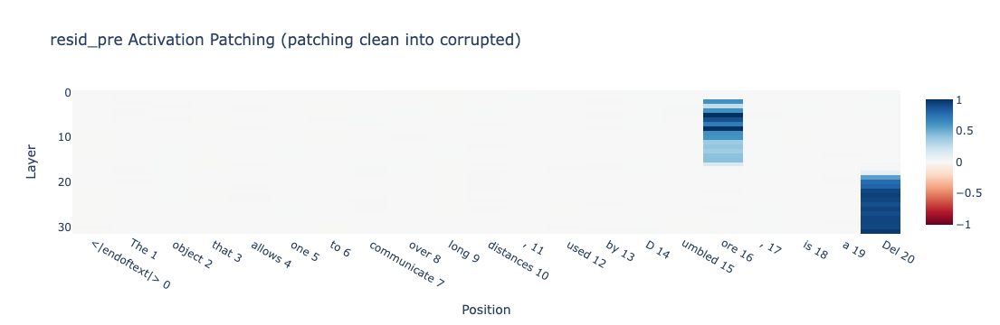

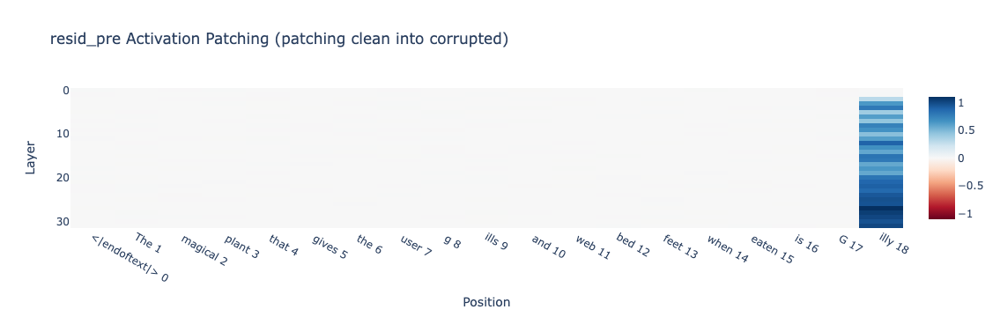

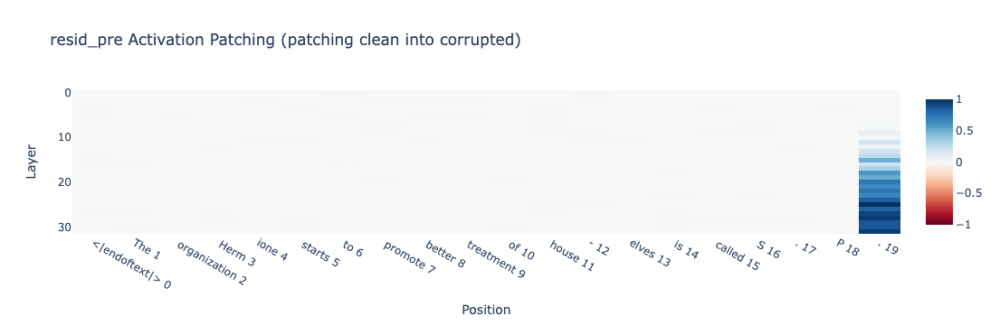

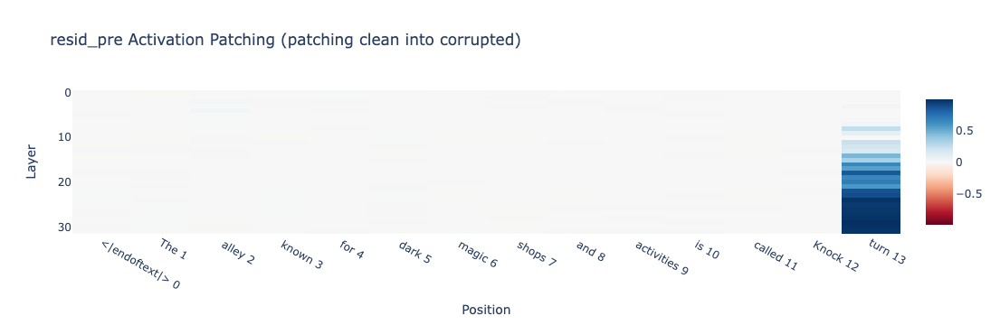

In [480]:
for i in range(len(labels)):

    imshow(
        act_patch_resid_pres[i],
        labels={"x": "Position", "y": "Layer"},
        x=labels[i],
        title="resid_pre Activation Patching (patching clean into corrupted)",
        width=600
    )


In [481]:

reverse_act_patch_resid_pres = []
labels = []
for i in range(min(MAX_ITERS, tokens.shape[0])):
    clean_toks = model.to_tokens(prompts[i], prepend_bos=True)
    # clean_toks = tokens[i:i+1]
    last_inds = last_indices[i:i+1]
    answer_toks = answer_tokens[i:i+1]
    small_corrupted_probs = corrupted_probs_correct[i:i+1]
    small_clean_probs = original_probs_correct[i:i+1]

    small_clean_logits, small_clean_cache = model.run_with_cache(clean_toks)
    corrupt_embedding = partial(corrupt_embedding_hook, patch_indices=patch_indices[i:i+1])
    model.reset_hooks()
    model.add_hook('hook_embed', corrupt_embedding)
    small_corrupted_logits, small_corrupted_cache = model.run_with_cache(clean_toks)
    model.reset_hooks() #need to get rid of hook after doing patching

    metric = partial(recovery_metric, last_indices=last_inds, answer_tokens=answer_toks, corrupted_probs =small_corrupted_probs, clean_probs=small_clean_probs)
    act_patch_resid_pre = patching.get_act_patch_resid_pre(
        model = model,
        corrupted_tokens = clean_toks,
        clean_cache = small_corrupted_cache,
        patching_metric = metric
    )
    reverse_act_patch_resid_pres.append(act_patch_resid_pre)
    labels.append([f"{tok} {i}" for i, tok in enumerate(model.to_str_tokens(clean_toks))])

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/896 [00:00<?, ?it/s]

  0%|          | 0/928 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/800 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/256 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/736 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/864 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

  0%|          | 0/640 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/832 [00:00<?, ?it/s]

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/640 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/640 [00:00<?, ?it/s]

  0%|          | 0/576 [00:00<?, ?it/s]

  0%|          | 0/416 [00:00<?, ?it/s]

  0%|          | 0/864 [00:00<?, ?it/s]

  0%|          | 0/544 [00:00<?, ?it/s]

  0%|          | 0/384 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/704 [00:00<?, ?it/s]

  0%|          | 0/608 [00:00<?, ?it/s]

In [486]:
import pandas as pd

In [509]:
data_list = []
for i in range(min(MAX_ITERS, tokens.shape[0])):
    prompt = prompts[i]
    answer = answers[i]
    objects = corruption_strings[i]
    clean_toks = model.to_tokens(prompts[i], prepend_bos=True)
    str_toks = model.to_str_tokens(prompts[i], prepend_bos=True)
    small_corrupted_probs = corrupted_probs_correct[i:i+1]
    small_clean_probs = original_probs_correct[i:i+1]
    reverse_act_patch = reverse_act_patch_resid_pres[i]
    act_patch = act_patch_resid_pres[i]
    data_list.append({
        'prompt' : prompt,
        'answer' : answer,
        'objects' : objects,
        'prompt_tokens' : clean_toks.cpu().numpy(),
        'prompt_str_tokens' : str_toks,
        'clean_prob' : small_clean_probs.item(),
        'corrupted_prob' : small_corrupted_probs.item(),
        'act_patch' : act_patch.cpu().numpy(),
        'reverse_act_patch' : reverse_act_patch.cpu().numpy(),
    })
df = pd.DataFrame(data_list)
df.head()


,prompt,answer,objects,prompt_tokens,prompt_str_tokens,clean_prob,corrupted_prob,act_patch,reverse_act_patch
0,Voldemort's actual name was Tom Marvolo,R,"[Voldemort's, Tom Marvolo]","[[0, 55, 744, 358, 430, 434, 4588, 1416, 369, ...","[<|endoftext|>, V, old, em, ort, 's, actual, ...",0.961298,0.000352,"[[-0.00025124205, 0.0013499489, -0.0001343167,...","[[0.9999999, 0.9943583, 0.9829641, 0.9931691, ..."
1,"When Harry Potter went back to class, he saw t...",We,"[ Harry Potter, Hermione Granger]","[[0, 3039, 11643, 28753, 2427, 896, 281, 966, ...","[<|endoftext|>, When, Harry, Potter, went, ...",0.976687,0.001637,"[[0.0024199204, 0.0014548677, 0.016717227, 0.0...","[[1.0000023, 1.0000023, 0.951611, 0.96038353, ..."
2,"J.K. Rowling is the author of the book series """,Harry,[J.K. Rowling],"[[0, 43, 15, 44, 15, 15784, 1981, 310, 253, 24...","[<|endoftext|>, J, ., K, ., Row, ling, is, ...",0.953377,0.000780,"[[-0.0005425212, -0.00025214395, -0.0005322025...","[[1.0000006, 0.9462252, 0.9415986, 0.9583951, ..."
3,Harry Potter studies at the wizarding school n...,Hog,[Harry Potter],"[[0, 33244, 28753, 2175, 387, 253, 259, 478, 1...","[<|endoftext|>, Harry, Potter, studies, at,...",0.350461,0.027536,"[[0.08487414, 0.5551957, 0.16567747, 0.3670400...","[[0.99999815, 0.35405305, 0.66945136, 0.999998..."
4,Some of the most popular novels about wizards ...,Harry,[ wizards],"[[0, 6080, 273, 253, 954, 4633, 19204, 670, 25...","[<|endoftext|>, Some, of, the, most, popul...",0.422437,0.005146,"[[-0.0060291, -0.0011453568, 0.001441625, 0.00...","[[0.99999464, 0.99999464, 0.99999464, 0.999994..."


In [511]:
!pwd

/root/unlearning/activation_patching/chapter1_transformer_interp/exercises/part3_indirect_object_identification


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [512]:
df.iloc[0]['act_patch'].shape
# Assuming df is your DataFrame
df.to_pickle('/root/unlearning/activation_patching/patching_data.pkl')

In [507]:
df_loaded = pd.read_pickle('patching_data.pkl')
df_loaded.head()

,prompt,answer,objects,prompt_tokens,clean_prob,corrupted_prob,act_patch,reverse_act_patch
0,Voldemort's actual name was Tom Marvolo,R,"[Voldemort's, Tom Marvolo]","[[0, 55, 744, 358, 430, 434, 4588, 1416, 369, ...",0.961298,0.000352,"[[-0.00025124205, 0.0013499489, -0.0001343167,...","[[0.9999999, 0.9943583, 0.9829641, 0.9931691, ..."
1,"When Harry Potter went back to class, he saw t...",We,"[ Harry Potter, Hermione Granger]","[[0, 3039, 11643, 28753, 2427, 896, 281, 966, ...",0.976687,0.001637,"[[0.0024199204, 0.0014548677, 0.016717227, 0.0...","[[1.0000023, 1.0000023, 0.951611, 0.96038353, ..."
2,"J.K. Rowling is the author of the book series """,Harry,[J.K. Rowling],"[[0, 43, 15, 44, 15, 15784, 1981, 310, 253, 24...",0.953377,0.000780,"[[-0.0005425212, -0.00025214395, -0.0005322025...","[[1.0000006, 0.9462252, 0.9415986, 0.9583951, ..."
3,Harry Potter studies at the wizarding school n...,Hog,[Harry Potter],"[[0, 33244, 28753, 2175, 387, 253, 259, 478, 1...",0.350461,0.027536,"[[0.08487414, 0.5551957, 0.16567747, 0.3670400...","[[0.99999815, 0.35405305, 0.66945136, 0.999998..."
4,Some of the most popular novels about wizards ...,Harry,[ wizards],"[[0, 6080, 273, 253, 954, 4633, 19204, 670, 25...",0.422437,0.005146,"[[-0.0060291, -0.0011453568, 0.001441625, 0.00...","[[0.99999464, 0.99999464, 0.99999464, 0.999994..."


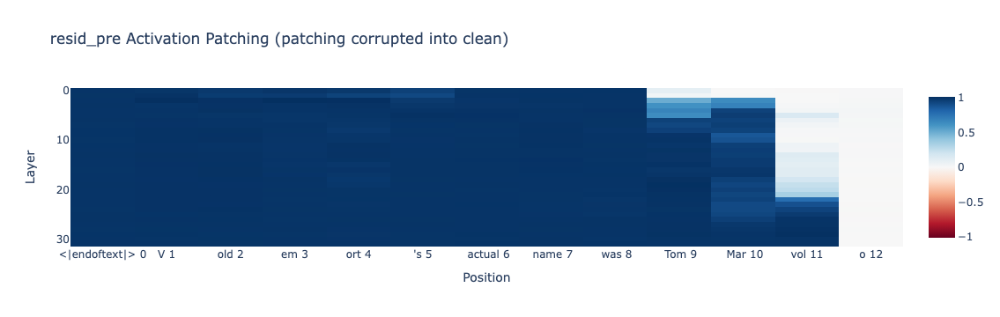

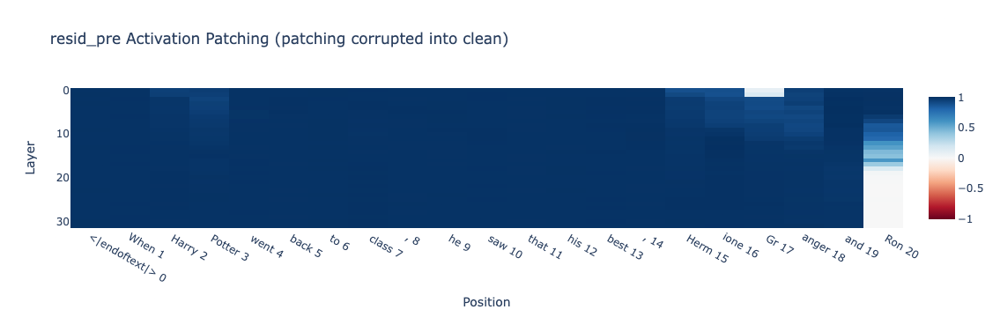

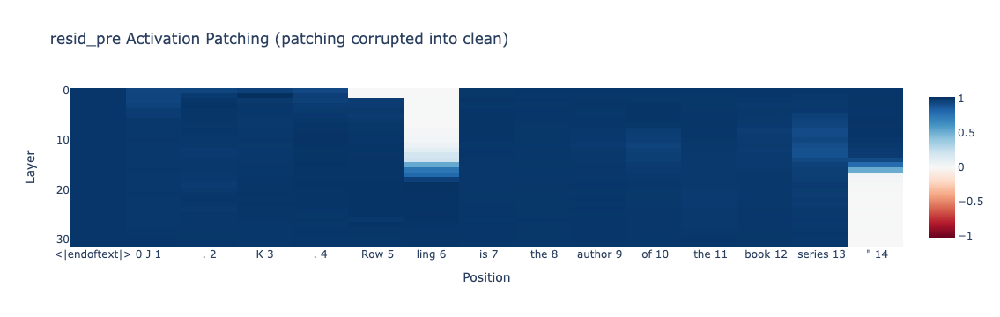

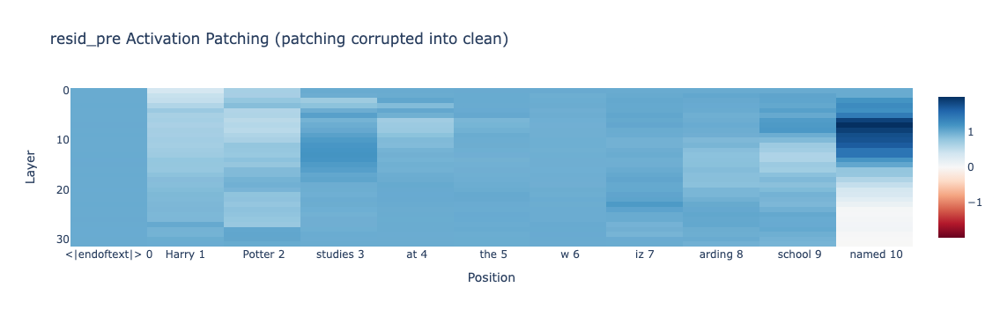

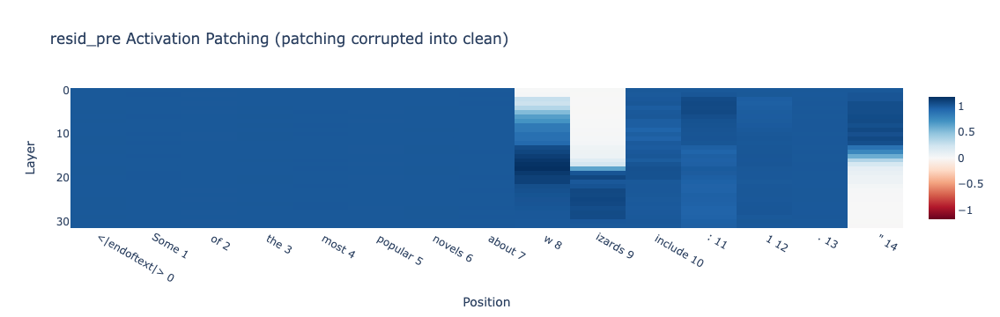

...

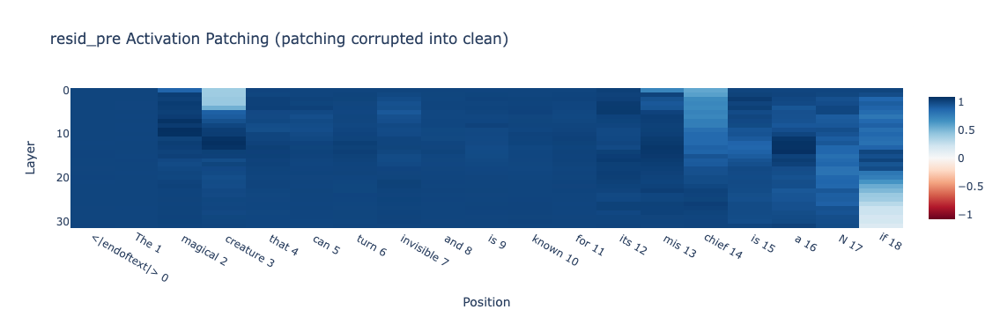

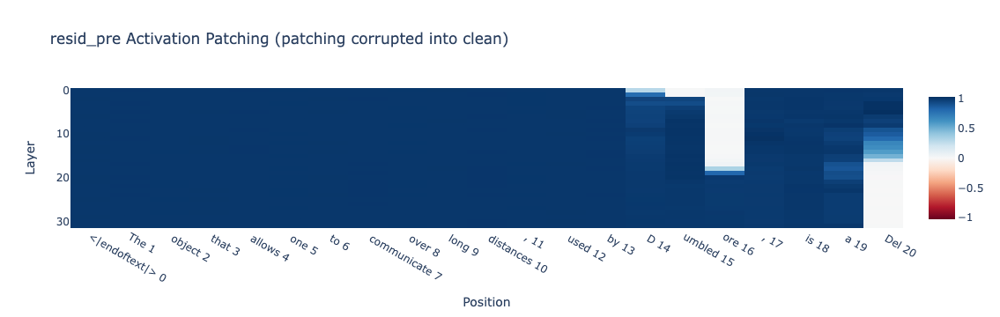

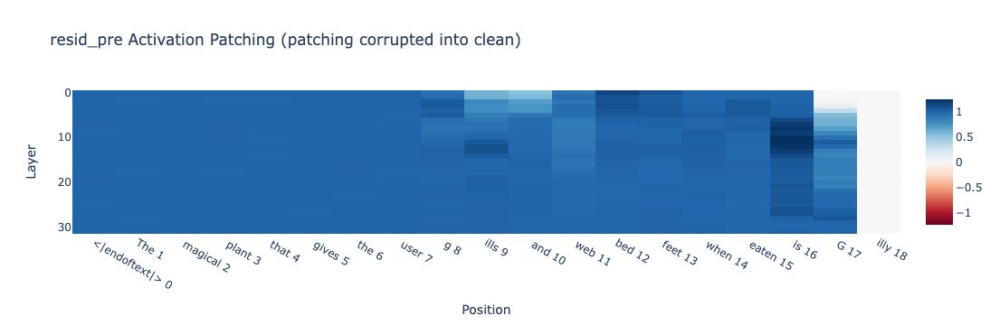

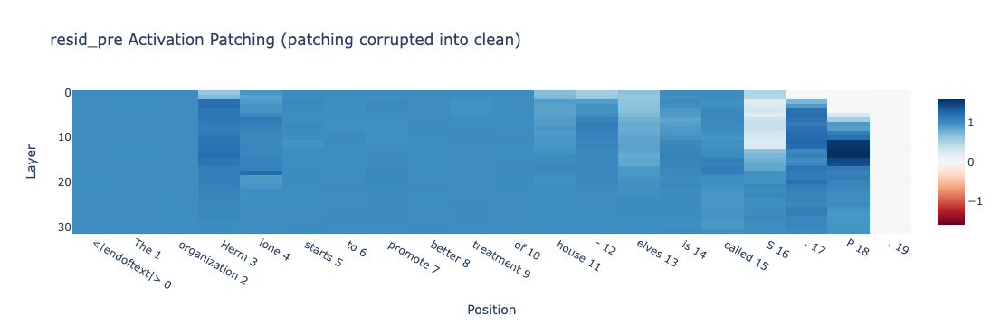

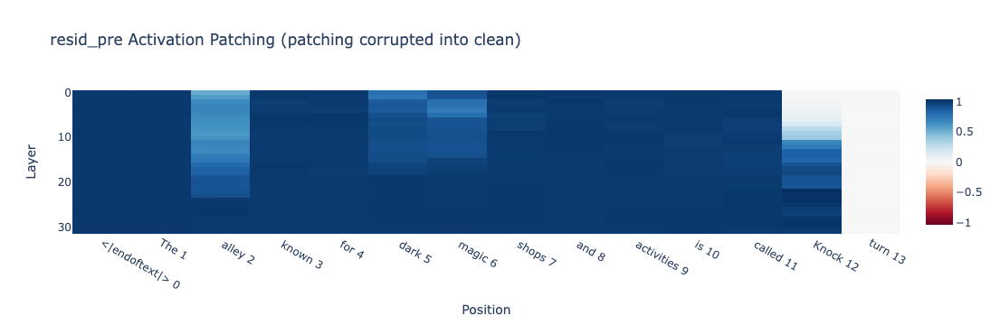

In [482]:
for i in range(len(labels)):

    imshow(
        reverse_act_patch_resid_pres[i],
        labels={"x": "Position", "y": "Layer"},
        x=labels[i],
        title="resid_pre Activation Patching (patching corrupted into clean)",
        width=600
    )